In [1]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

In [2]:
#回归问题评价指标
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
#分类问题评价指标
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import log_loss#对数损失（交叉熵损失）

In [3]:
data=pd.read_excel('FTIR.xlsx',index_col=0)
X=data.iloc[:,:-1].values
y=data.iloc[:,-1].values
columns=data.iloc[:,:-1].columns.values


In [4]:
# 将数据分为训练集、验证集和测试集
from sklearn.model_selection import train_test_split

# 第一次划分：70%训练集，30%为临时集（包含验证集和测试集）
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=123)

# 第二次划分：从临时集中划分出验证集和测试集（1:2的比例）
# 30% * (1/3) = 10% 验证集
# 30% * (2/3) = 20% 测试集
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=123)

# 打印各个数据集的形状
print('X_train.shape:', X_train.shape)
print('y_train.shape:', y_train.shape)
print('X_val.shape:', X_val.shape)
print('y_val.shape:', y_val.shape)
print('X_test.shape:', X_test.shape)
print('y_test.shape:', y_test.shape)

X_train.shape: (121, 3401)
y_train.shape: (121,)
X_val.shape: (17, 3401)
y_val.shape: (17,)
X_test.shape: (36, 3401)
y_test.shape: (36,)


In [5]:
#定义函数计算评价指标
def calculate_metrics_two(y_true,y_pred):#二分类
    accuracy=accuracy_score(y_true,y_pred)
    sensitivity=recall_score(y_true,y_pred)#敏感性（召回率）
    specificity=confusion_matrix(y_true,y_pred)[0,0]/(confusion_matrix(y_true,y_pred)[0,0]+confusion_matrix(y_true,y_pred)[0,1])
    positive_predictive_values=precision_score(y_true,y_pred)
    negative_predictive_value=confusion_matrix(y_true,y_pred)[1,1]/(confusion_matrix(y_true,y_pred)[1,1]+confusion_matrix(y_true,y_pred)[1,0])
    f1=f1_score(y_true,y_pred)
    kappa=cohen_kappa_score(y_true,y_pred)
    return [accuracy,sensitivity,specificity,positive_predictive_values,negative_predictive_value,f1,kappa]

def calculate_metrics_multi(y_true,y_pred):#多分类
    accuracy=accuracy_score(y_true,y_pred)
    precision=precision_score(y_true,y_pred,average='macro')
    recall=recall_score(y_true,y_pred,average='macro')
    f1=f1_score(y_true,y_pred,average='macro')
    kappa=cohen_kappa_score(y_true,y_pred)
    return [accuracy,precision,recall,f1,kappa]

In [6]:
# 创建LDA分类器
lda = LinearDiscriminantAnalysis()

# 定义超参数网格
param_grid = {
    'solver': ['svd', 'lsqr', 'eigen'],    # 选择求解器
    'shrinkage': [None, 'auto', 0.1, 0.5, 0.9]  # 收缩参数，仅在'lsqr'和'eigen'中使用
}

grid=GridSearchCV(lda,param_grid=param_grid,cv=5)

grid.fit(X_train,y_train)

#获取最佳参数
best_params=grid.best_params_
print("网格搜索的最佳参数：",best_params)

best_model = grid.best_estimator_
 
y_pred_train = best_model.predict(X_train) 
y_pred_val = best_model.predict(X_val)
y_pred_test = best_model.predict(X_test)

[accuracy_train,precision_train,recall_train,f1_train,kappa_train]=calculate_metrics_multi(y_pred_train,y_train) 
[accuracy_val,precision_val,recall_val,f1_val,kappa_val]=calculate_metrics_multi(y_pred_val,y_val)
[accuracy_test,precision_test,recall_test,f1_test,kappa_test]=calculate_metrics_multi(y_pred_test,y_test) 
print("训练集准确率",accuracy_train) 
print("训练集精确率",precision_train) 
print("训练集召回率：",recall_train) 
print("训练集F1分数：",f1_train) 
print("训练集Kappa系数：",kappa_train) 

print("验证集准确率：",accuracy_val)
print("验证集精确率",precision_val)
print("验证集召回率",recall_val)
print("验证集F1分数：",f1_val)
print("验证集Kappa系数：",kappa_val)

print("测试集准确率：",accuracy_test) 
print("测试集精确率",precision_test) 
print("测试集召回率",recall_test) 
print("测试集F1分数：",f1_test) 
print("测试集Kappa系数：",kappa_test)

d:\Anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
25 fits failed out of a total of 75.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Anaconda\Lib\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "d:\Anaconda\Lib\site-packages\sklearn\discriminant_analysis.py", line 645, in fit
    self._solve_eigen(
  File "d:\Anaconda\Lib\site-packages\sklearn\

网格搜索的最佳参数： {'shrinkage': 'auto', 'solver': 'lsqr'}
训练集准确率 1.0
训练集精确率 1.0
训练集召回率： 1.0
训练集F1分数： 1.0
训练集Kappa系数： 1.0
验证集准确率： 1.0
验证集精确率 1.0
验证集召回率 1.0
验证集F1分数： 1.0
验证集Kappa系数： 1.0
测试集准确率： 0.9722222222222222
测试集精确率 0.9583333333333334
测试集召回率 0.9833333333333334
测试集F1分数： 0.9692307692307692
测试集Kappa系数： 0.9537869062901155


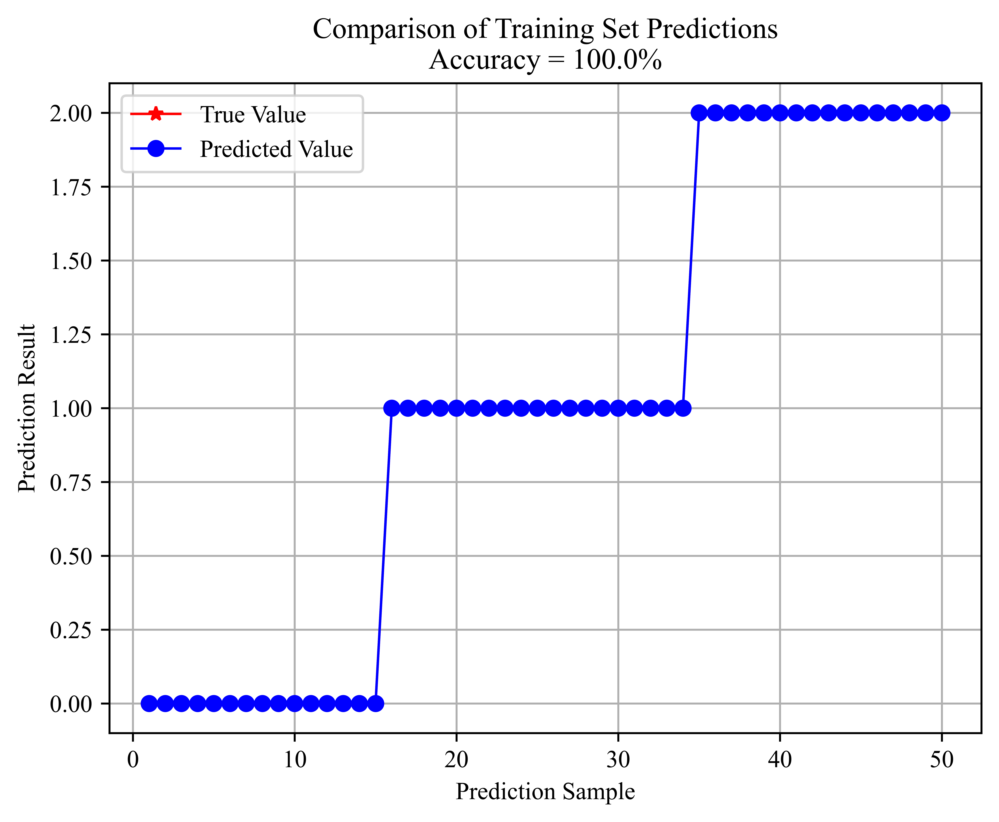

In [7]:
N = len(y_train)
index_50_train=np.random.choice(range(0, N), 50, replace=True)#随机挑选50个样本出来，样本太多不好显示
y_train_=y_train[index_50_train]
y_train_pred_=y_pred_train[index_50_train]

index_train = np.argsort(y_train_)
y_train_sort = np.sort(y_train_)

y_pred_train_sort = np.array(y_train_pred_)[index_train]

plt.figure( dpi=1200)

plt.rcParams["font.family"] = "Times New Roman"

# 绘制真实值曲线
plt.plot(np.arange(1, 50+1), y_train_sort, 'r-*', label='True Value', linewidth=1)

# 绘制预测值曲线
plt.plot(np.arange(1, 50+1), y_pred_train_sort, 'b-o', label='Predicted Value', linewidth=1)

# 添加图例
plt.legend()

# 设置x轴标签
plt.xlabel('Prediction Sample')

# 设置y轴标签
plt.ylabel('Prediction Result')

# 设置标题，将准确率信息添加到标题中
string = f"Comparison of Training Set Predictions\nAccuracy = {accuracy_train*100}%"
plt.title(string)

# 添加网格
plt.grid()

# 显示图形
plt.show()

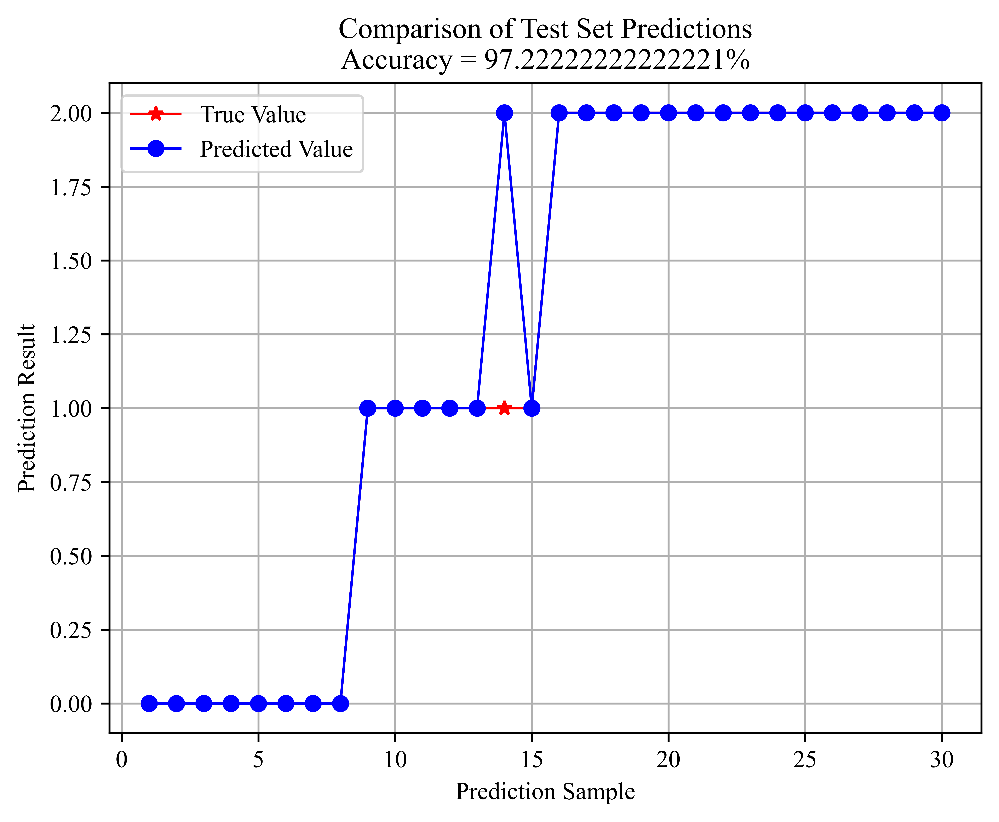

In [8]:
N = len(y_test)
index_30_test=np.random.choice(range(0, N), 30, replace=True)#随机挑选20个样本出来，样本太多不好显示
y_test_=y_test[index_30_test]
y_test_pred_=y_pred_test[index_30_test]

index_test= np.argsort(y_test_)
y_test_sort = np.sort(y_test_)

y_pred_test_sort = np.array(y_test_pred_)[index_test]

plt.figure( dpi=1200)

plt.rcParams["font.family"] = "Times New Roman"

# 绘制真实值曲线
plt.plot(np.arange(1, 30 + 1), y_test_sort, 'r-*', label='True Value', linewidth=1)

# 绘制预测值曲线
plt.plot(np.arange(1, 30 + 1), y_pred_test_sort, 'b-o', label='Predicted Value', linewidth=1)

# 添加图例
plt.legend()

# 设置x轴标签
plt.xlabel('Prediction Sample')

# 设置y轴标签
plt.ylabel('Prediction Result')

# 设置标题，将准确率信息添加到标题中
string = f"Comparison of Test Set Predictions\nAccuracy = {accuracy_test*100}%"
plt.title(string)

# 添加网格
plt.grid()

# 显示图形
plt.show()

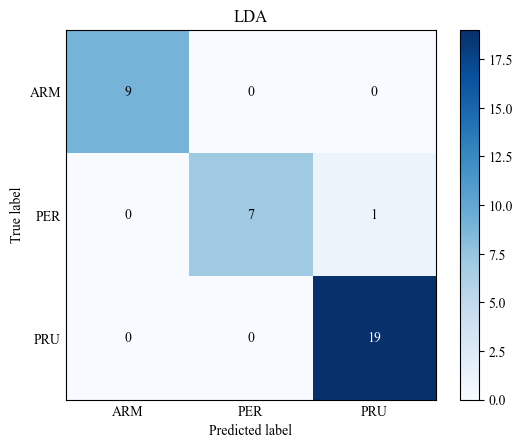

In [9]:
import scikitplot as skplt
mapping = { 0: 'ARM',   1: 'PER',2: 'PRU'} 

y_test_map= [mapping[i] if i in mapping else i for i in y_test] 
y_pred_test_map = [mapping[i] if i in mapping else i for i in np.array(y_pred_test)] 
plot = skplt.metrics.plot_confusion_matrix(y_test_map, y_pred_test_map)

plt.tick_params(axis='both', which='both', length=0)  


plt.title('LDA')
plt.savefig('LDA.png', dpi=800,bbox_inches='tight') 
plt.show()

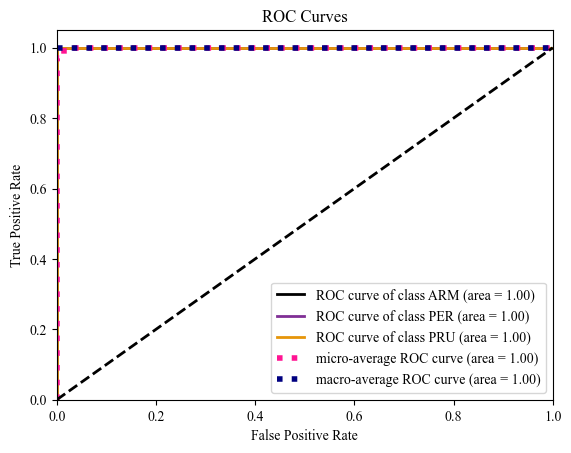

In [10]:
y_pred_proba=best_model.predict_proba(X_test)
#'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Grays', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_grey', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gist_yerg', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'grey', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'
skplt.metrics.plot_roc(y_test_map, y_pred_proba,cmap='CMRmap')
plt.savefig('LDA roc.png', dpi=800,bbox_inches='tight') 
plt.show()


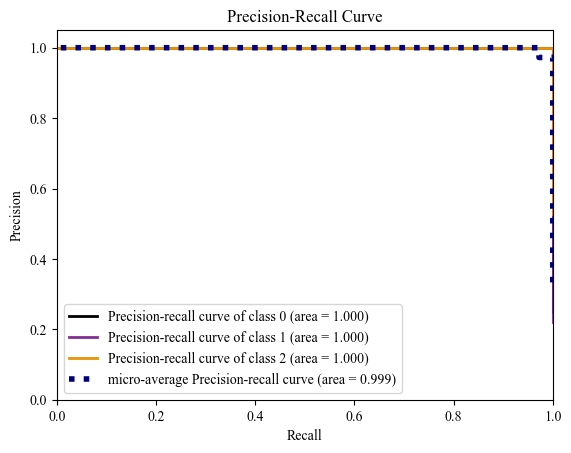

In [11]:
skplt.metrics.plot_precision_recall(y_test,y_pred_proba,cmap='CMRmap')
plt.savefig('LDA pr.png', dpi=800,bbox_inches='tight')


In [12]:
from sklearn.model_selection import cross_val_score, KFold
def cv(model,X,y):
    # 设置交叉验证的折数
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # 进行交叉验证并计算R2分数
    accuracy = cross_val_score(model, X, y, cv=kf, scoring='accuracy')

    # 进行交叉验证并计算均方根误差（RMSE）
    precision_scores=[]
    recall_scores=[]
    f1_scores=[]
    kappa_scoers=[]
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        [accuracy_,precision_,recall_,f1_,kappa_]=calculate_metrics_multi(y_pred,y_test)
        precision_scores.append(precision_)
        recall_scores.append(recall_)
        f1_scores.append(f1_)
        kappa_scoers.append(kappa_)


    #交叉验证分数
    print('5折交叉验证分数')
    print("accuracy平均值: ", np.mean(accuracy))
    print("accuracy标准差: ", np.std(accuracy))
    print("precision平均值: ", np.mean(precision_scores))
    print("precision标准差: ", np.std(precision_scores))
    print("recall平均值: ", np.mean(recall_scores))
    print("recall标准差: ", np.std(recall_scores))
    print("f1_scores平均值: ", np.mean(f1_scores))
    print("f1_scores标准差: ", np.std(f1_scores))
    print("kappa_scoers平均值: ", np.mean(kappa_scoers))
    print("kappa_scoers标准差: ", np.std(kappa_scoers))

cv(best_model,X_train,y_train)

5折交叉验证分数
accuracy平均值:  0.9916666666666668
accuracy标准差:  0.016666666666666653
precision平均值:  0.9866666666666667
precision标准差:  0.026666666666666707
recall平均值:  0.9925925925925926
recall标准差:  0.014814814814814836
f1_scores平均值:  0.9886710239651416
f1_scores标准差:  0.02265795206971681
kappa_scoers平均值:  0.9867768595041323
kappa_scoers标准差:  0.026446280991735537


In [13]:
wavenumbers=['波长' + str(x) for x in wavenumbers]
X_test_=pd.DataFrame(X_test,columns=wavenumbers)
X_test_.head()

NameError: name 'wavenumbers' is not defined

In [ ]:
import shap

explainer = shap.KernelExplainer(best_model.predict_proba, X_test_) 

# 计算 SHAP 值
shap_values = explainer.shap_values(X_test_)

# 计算shap值为Explanation格式
shap_values_Explanation = explainer(X_test_)

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


NameError: name 'X_test_' is not defined

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


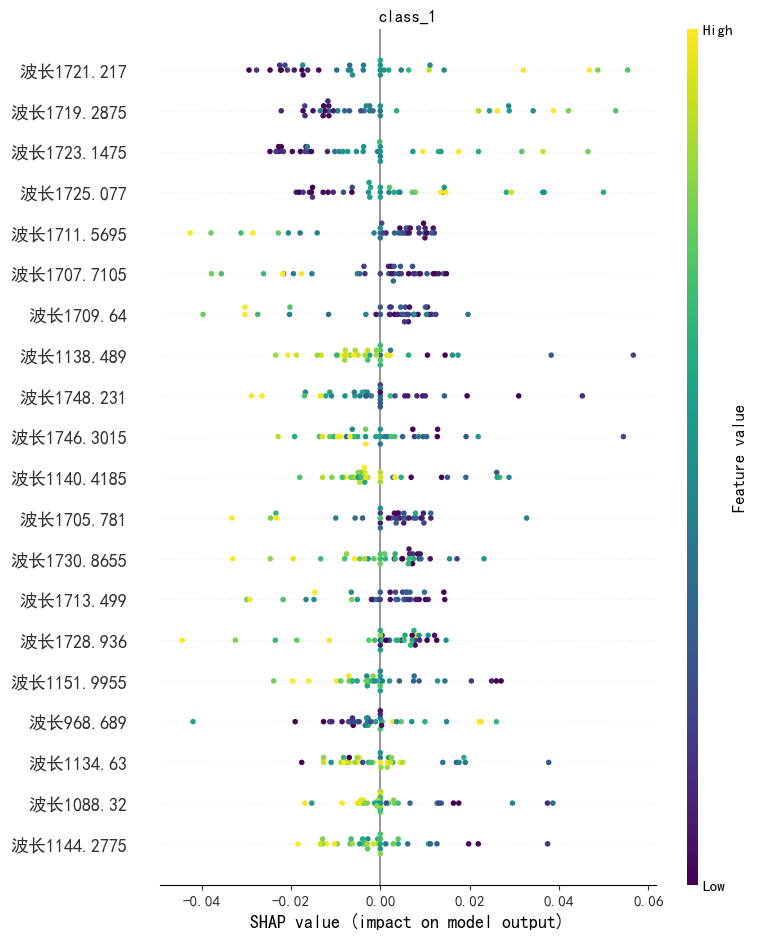

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = wavenumbers

# 设置 matplotlib 的全局字体配置
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0]
shap_values_class_2 = shap_values[1]
shap_values_class_3 = shap_values[2]
shap_values_class_4 = shap_values[3]

# 绘制 SHAP 总结图，使用viridis配色方案
plt.figure()
plt.title('class_1')
shap.summary_plot(shap_values_class_1, X_test_, feature_names=labels, plot_type="dot", cmap="viridis")
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


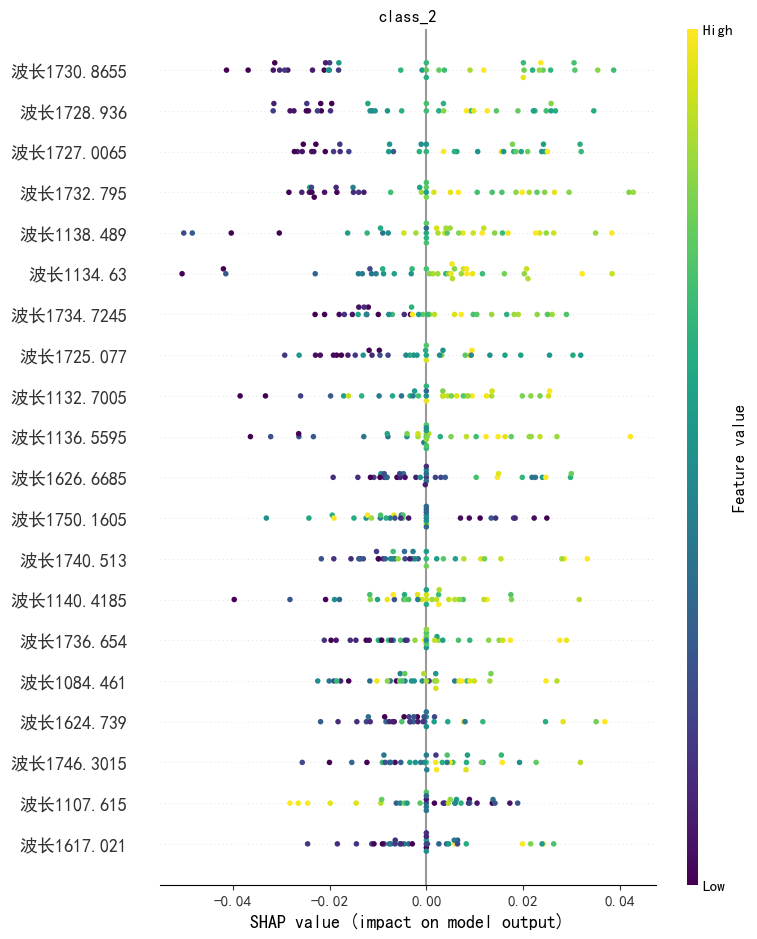

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = wavenumbers


# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0]
shap_values_class_2 = shap_values[1]
shap_values_class_3 = shap_values[2]
shap_values_class_4 = shap_values[3]


# 绘制 SHAP 总结图，使用viridis配色方案
plt.figure()
plt.title('class_2')
shap.summary_plot(shap_values_class_2, X_test_, feature_names=labels, plot_type="dot", cmap="viridis")
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


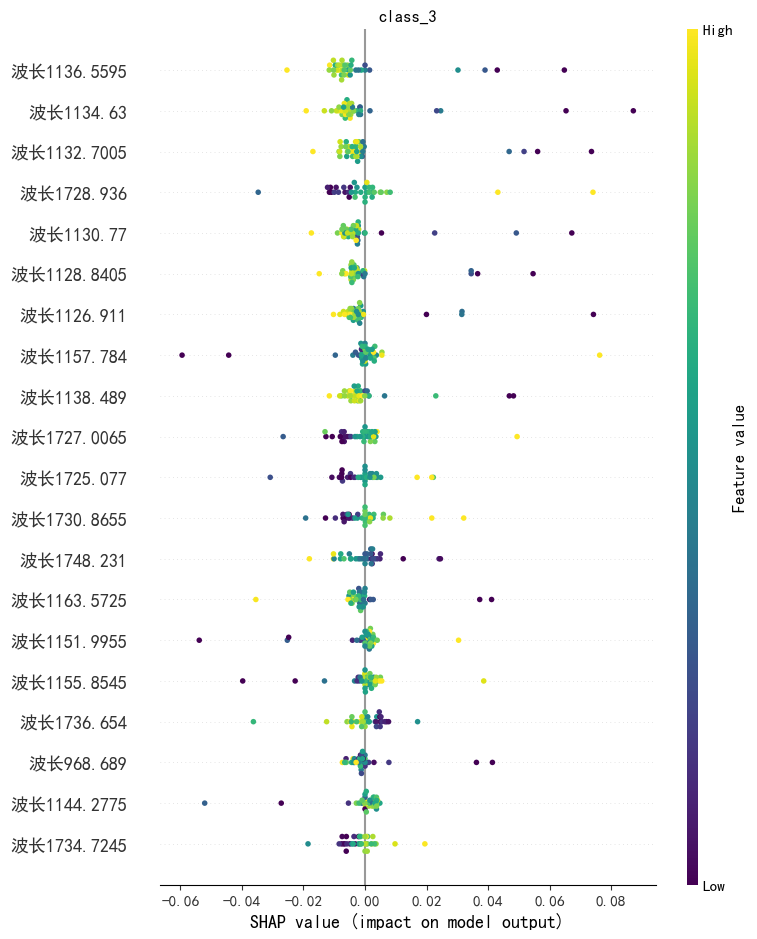

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = wavenumbers

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0]
shap_values_class_2 = shap_values[1]
shap_values_class_3 = shap_values[2]
shap_values_class_4 = shap_values[3]


# 绘制 SHAP 总结图，使用viridis配色方案
plt.figure()
plt.title('class_3')
shap.summary_plot(shap_values_class_3, X_test_, feature_names=labels, plot_type="dot", cmap="viridis")
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


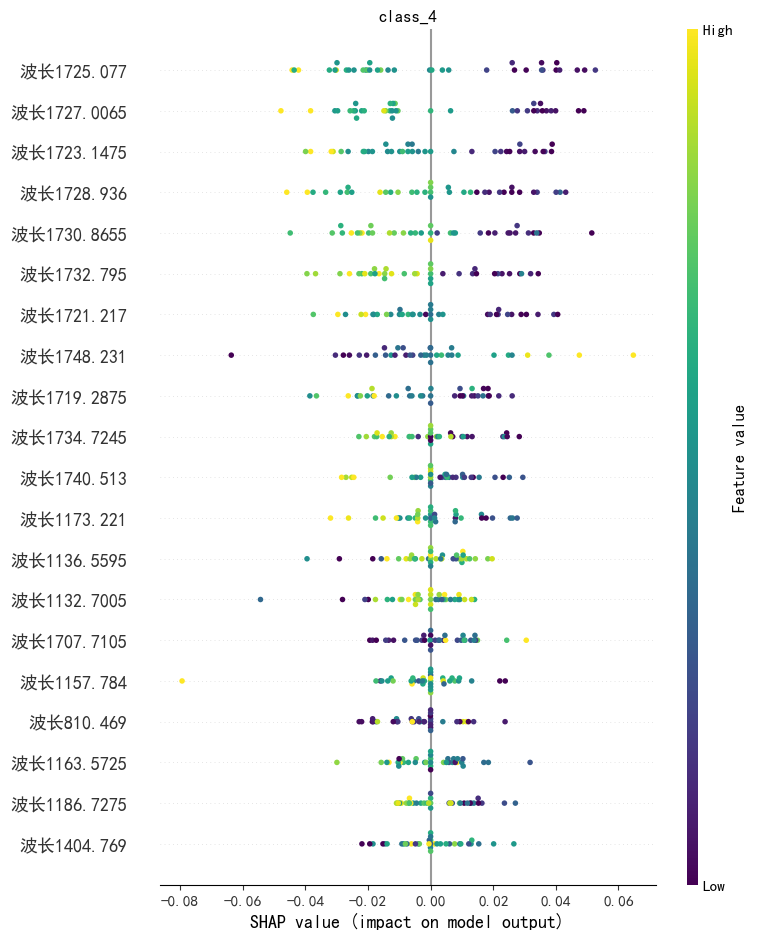

In [ ]:
import matplotlib.pyplot as plt
# 特征标签
labels = wavenumbers

# 提取每个类别的 SHAP 值
shap_values_class_1 = shap_values[0]
shap_values_class_2 = shap_values[1]
shap_values_class_3 = shap_values[2]
shap_values_class_4 = shap_values[3]


# 绘制 SHAP 总结图，使用viridis配色方案
plt.figure()
plt.title('class_4')
shap.summary_plot(shap_values_class_4, X_test_, feature_names=labels, plot_type="dot", cmap="viridis")
plt.show()

In [ ]:
plt.figure(figsize=(10, 5), dpi=1200)
shap.plots.bar(shap_values_Explanation[:,:,0],show=False)#对于类别1的特征重要性
plt.title('SHAP_Explanation Sorted Feature Importance')
plt.tight_layout()
plt.show()

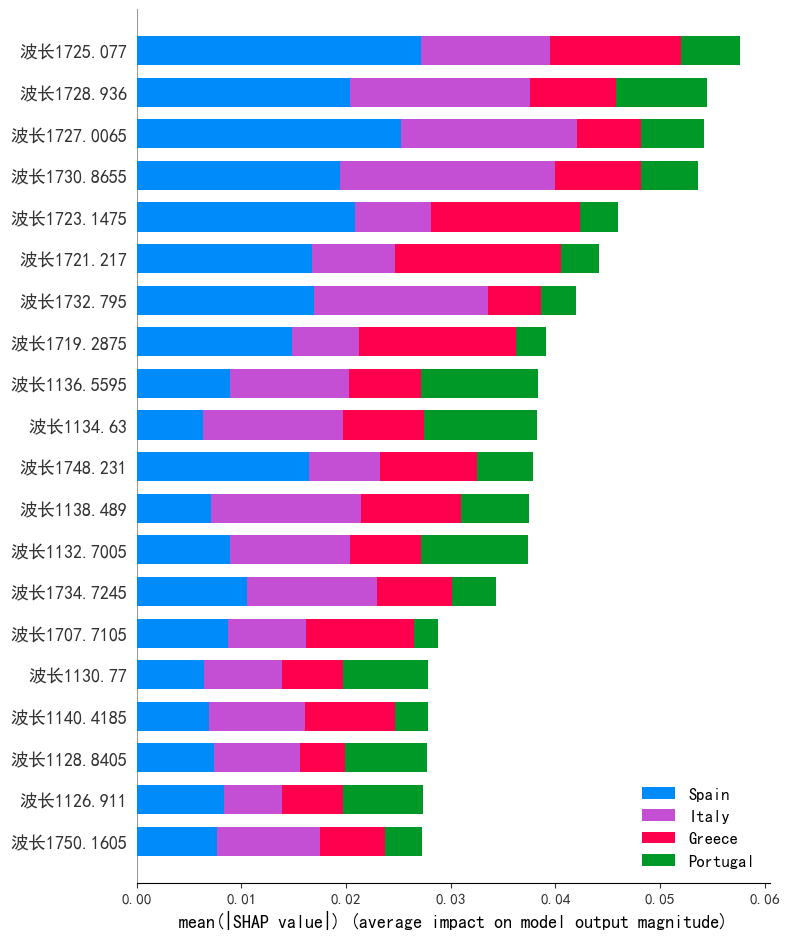

In [ ]:
shap.summary_plot(shap_values,X_test_, plot_type="bar",
class_names=['Greece', 'Italy','Portugal','Spain'],feature_names = labels)

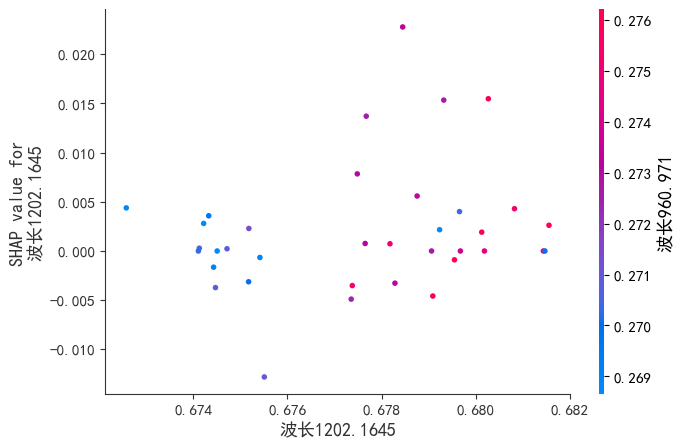

In [ ]:
shap.dependence_plot('波长1202.1645', shap_values_class_1, X_test_, interaction_index='波长960.971')#类别1
plt.show()

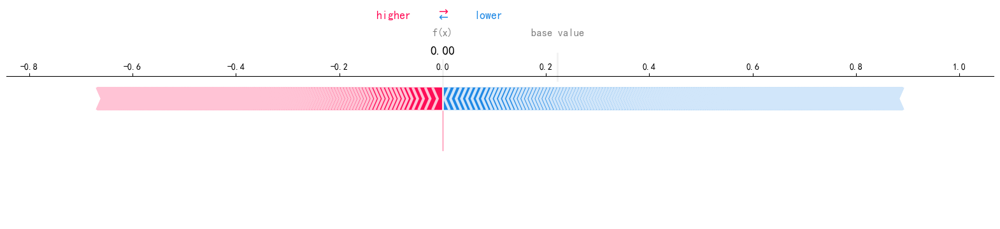

In [ ]:

# 选择一个样本索引进行解释
sample_index = 1
expected_value = explainer.expected_value[0]  # 需要指定个类别的基准值，这里是第一个类别
# 获取单个样本的 SHAP 值
sample_shap_values = shap_values_class_1[sample_index]

# 绘制 SHAP 解释力图 (Force Plot)
shap.force_plot(expected_value, sample_shap_values, X_test_.iloc[sample_index], matplotlib=True)
# 显示绘图
plt.show()

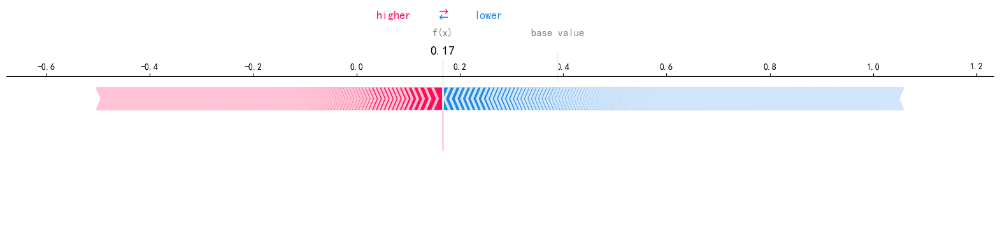

In [ ]:
# 选择一个样本索引进行解释
sample_index = 1
expected_value = explainer.expected_value[3]  # 需要指定个类别的基准值，这里是第4个类别
# 获取单个样本的 SHAP 值
sample_shap_values = shap_values_class_1[sample_index]

# 绘制 SHAP 解释力图 (Force Plot)
shap.force_plot(expected_value, sample_shap_values, X_test_.iloc[sample_index], matplotlib=True)
# 显示绘图
plt.show()

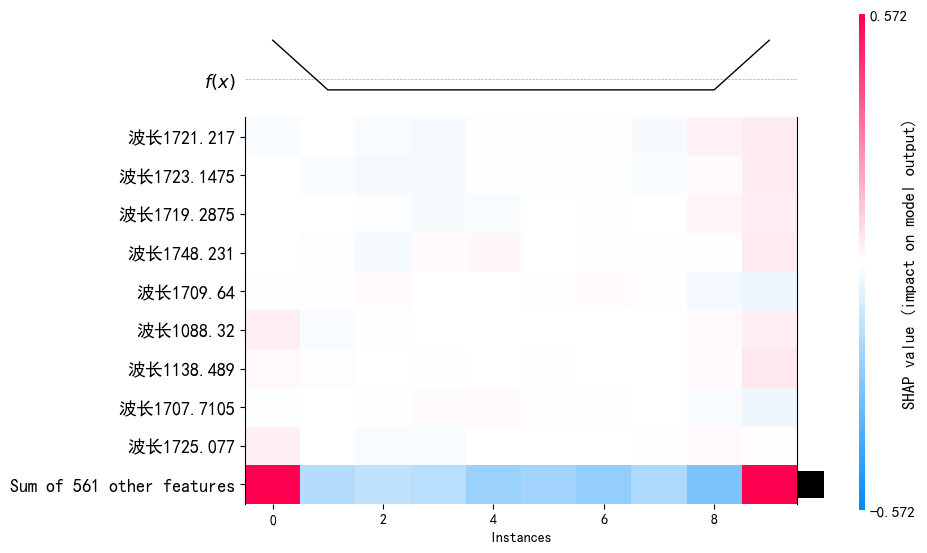

In [ ]:
expected_value = explainer.expected_value[0]  # 需要指定个类别的基准值，这里是第一个类别 
# 创建 shap.Explanation 对象
shap_explanation = shap.Explanation(values=shap_values_class_1[0:10, :], #取前10个样本显示
                                    base_values=  expected_value, 
                                    data=X_test_.iloc[0:10, :], 
                                    feature_names=X_test_.columns)

# 绘制热图
plt.figure()
shap.plots.heatmap(shap_explanation)
plt.show()

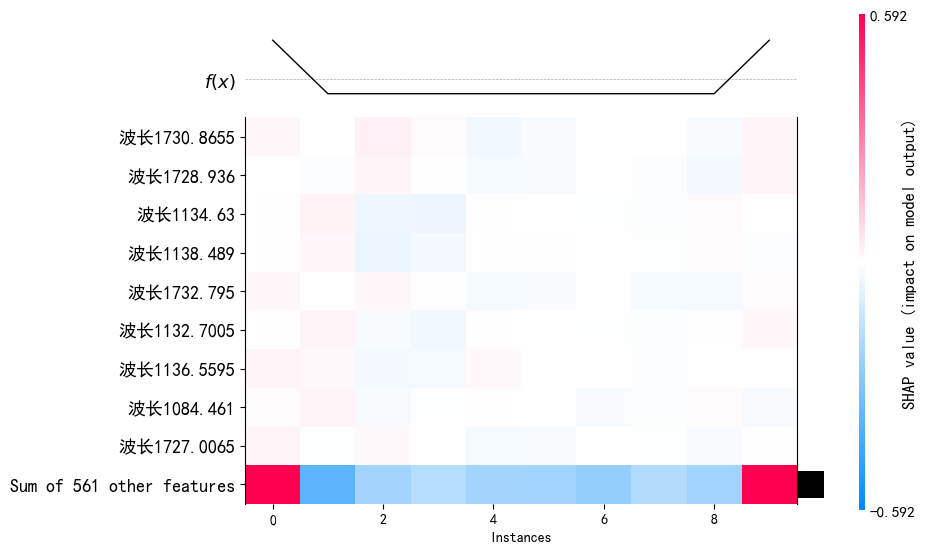

In [ ]:
expected_value = explainer.expected_value[1]  # 需要指定个类别的基准值，这里是第二个类别 
# 创建 shap.Explanation 对象
shap_explanation = shap.Explanation(values=shap_values_class_2[0:10, :], #取前10个样本显示
                                    base_values=  expected_value, 
                                    data=X_test_.iloc[0:10, :], 
                                    feature_names=X_test_.columns)

# 绘制热图
plt.figure()
shap.plots.heatmap(shap_explanation)
plt.show()

In [ ]:
plt.figure(figsize=(10, 5), dpi=1200)
# 创建 SHAP 值条形图，展示数据
shap.plots.bar(shap_values_Explanation[0,:,1], show_data=True, show=False, max_display=13)#单个样本对于类别1
plt.title('SHAP Explanation for Instance (Feature Importance with Data)')
plt.tight_layout()
plt.show()

Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.


In [ ]:
plt.figure(figsize=(10, 5), dpi=1200)
# 绘制第1个样本的 SHAP 瀑布图，并设置 show=False 以避免直接显示
shap.plots.waterfall(shap_values_Explanation[0,:,1], show=False, max_display=13)#对于第一个类别
# 保存图像为 PDF 文件
plt.savefig("SHAP_Waterfall_Plot_Sample_1.pdf", format='pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.
Glyph 8722 (\N{MINUS SIGN}) missing from current font.


In [ ]:
#关于类别1
# 获取模型的期望输出值（平均预测值）
expected_value = explainer.expected_value[0]
# 选择第2个样本的 SHAP 值
shap_values_ =shap_values[0][2]
# 决策图的特征名展示
features_display = wavenumbers
# 绘制 SHAP 决策图
plt.figure(figsize=(10, 5), dpi=1200)  
shap.decision_plot(expected_value, shap_values_, features_display, show=False)
plt.tight_layout()
plt.show()

In [ ]:
# 获取模型的期望输出值（平均预测值）
expected_value = explainer.expected_value[0]
# 计算预测值：根据 SHAP 值求和加上期望值，再将结果通过阈值判断为分类输出
y_pred = (shap_values[0].sum(1) + expected_value) > 0
# 计算错分类的样本
misclassified = y_pred != y_test
# 决策图展示的特征
features_display =wavenumbers
# 绘制 SHAP 决策图，带有错分类的样本高亮
plt.figure(figsize=(10, 5), dpi=1200)  # 设置画布大小和分辨率
shap.decision_plot(expected_value, shap_values[0], features_display, 
                   link='logit', highlight=misclassified, show=False)
plt.tight_layout()
plt.show()

In [ ]:
# 获取错分类样本的索引
misclassified_indices = [i for i, val in enumerate(misclassified) if val]

# 过滤出错分类样本的 SHAP 值
shap_values_misclassified = shap_values[0][misclassified_indices]


# 绘制 SHAP 决策图，显示错分类的样本
plt.figure(figsize=(10, 5), dpi=1200)  # 设置画布大小和分辨率
shap.decision_plot(expected_value, 
                   shap_values_misclassified, 
                   link='logit', 
                   highlight=True,  # 高亮显示这些样本
                   feature_names=list(wavenumbers),  # 转换为列表以避免 TypeError
                   show=False)
plt.tight_layout()
plt.show()